In [1]:
# @title
### EP3 MAC0417 / MAC5768 ##################################################
#  AO PREENCHER ESSE CABEÇALHO COM O MEU NOME E O MEU NÚMERO USP,              #
#  DECLARO QUE SOU O ÚNICO AUTOR E RESPONSÁVEL PELAS RESPOSTAS NESTA LISTA.    #
#  TODAS AS PARTES FORAM DESENVOLVIDAS E IMPLEMENTADAS POR MIM, SEGUINDO AS    #
#  INSTRUÇÕES E QUE PORTANTO, NÃO CONSTITUEM DESONESTIDADE ACADÊMICA OU PLÁGIO.#
#                                                                              #
#  DECLARO TAMBÉM QUE SOU RESPONSÁVEL POR TODAS AS CÓPIAS                      #
#  DESSE PROGRAMA E QUE EU NÃO DISTRIBUI OU FACILITEI A                        #
#  SUA DISTRIBUIÇÃO. ESTOU CIENTE QUE OS CASOS DE PLÁGIO E                     #
#  DESONESTIDADE ACADÊMICA SERÃO TRATADOS SEGUNDO OS CRITÉRIOS                 #
#  DEFINIDOS NO CÓDIGO DE ÉTICA DA USP.                                        #
#  ENTENDO QUE LISTAS SEM ASSINATURA NÃO SERÃO CORRIGIDAS E,                   #
#  AINDA ASSIM, PODERÃO SER PUNIDOS POR DESONESTIDADE ACADÊMICA.               #
#                                                                              #
#  Nome : Érico Tiago Meireles                                                 #
#  NUSP : 9312428                                                              #
#  Turma: MAC5768 Visão e Processamento de Imagens                             #
#  Prof.: Ronaldo Fumio Hashimoto                                              #
################################################################################

## EP3 - Parte 1 -  Segmentação dos objetos de interesse


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

import cv2

pd.set_option('display.max_columns', None)  
pd.set_option('display.max_colwidth', None)

#### Importa os metadados

In [3]:
metadata = pd.read_csv(rf"../metadados.csv", sep=';')

#### Criação da tabela sumária geral:

In [4]:

## Lista todas as imagens dos dados do EP2

path_list = []
names = []
path_folder = []
for path, subdirs, files in os.walk("../data_EP2/"):
    for name in files:
        path_list.append((os.path.join(path, name)))
        path_folder.append(path.split(rf'/')[-1])
        names.append(name)

In [5]:
# Cria um dataframe com todas as imagens, diretórios e pastas do Ep2
df_images = pd.DataFrame({'path' : path_list,
                          'img' : names,
                          'folder' : path_folder
                          })

In [6]:
# Define uma nova coluna "classe" para agrupar todas as classes presentes em cada imagem

metadata['classe'] = metadata['classe_1']
metadata['n_objetos'] = 1

for i in range(2, 6):
    metadata['classe'] += ', ' + metadata.apply(lambda row: row['classe_' + str(i)] if pd.notnull(row['classe_' + str(i)]) else '', axis=1)
    metadata['n_objetos'] += metadata.apply(lambda row: 1 if pd.notnull(row['classe_' + str(i)]) else 0, axis=1)


# Remove ',' no final do string
metadata['classe'] = metadata['classe'].str.rstrip(', ')

metadata['classe'] = metadata['classe'].str.rstrip(', ')

In [7]:
metadata.head(2)

,img,classe_1,classe_2,classe_3,classe_4,classe_5,fundo,iluminacao,classe,n_objetos
0,001.JPEG,garfo,pilha,faca,colher,NaN,sofa,interno-claro,"garfo, pilha, faca, colher",4
1,002.JPEG,som,livro,capacete,NaN,NaN,sofa,interno-claro,"som, livro, capacete",3


In [8]:
# Separa as palavras por vírgula e cria uma lista única de palavras
palavras_unicas = set(palavra.strip() for palavra in ','.join(metadata['classe']).split(',') if palavra)
# Converte o conjunto de volta para uma lista
lista_palavras_unicas = list(palavras_unicas)

##### TABELA SUMÁRIA

In [9]:

# Define type como o tipo de transformação utilizada
df_images['type'] = df_images['path'].str.split(rf'\\').str[-2]
df_images['type'] = df_images['type'].str.split(rf'/').str[-1]
# Garantindo que o nome tenha JPEG maiúsculo
df_images['img'] = df_images['img'].str.upper()

In [10]:
# Cria a relação de todas as imagens com a sua classe e iluminação, através do metadado:

metadata = df_images.merge(metadata, on='img', how='left')

#### Criação da Tabela Detalhada por Classe 

In [17]:
metadata.loc["n_objetos"] = metadata.apply(lambda row: len(row['classe'].split(',')), axis=1)
# len(metadata["classe"]).str.split(',')

In [15]:
metadata_unique = metadata.drop_duplicates('img')

### Avaliação dos métodos possíveis:

##### Amostragem para avaliação das 9 combinações possíveis de métodos de suavização e detecção de borda

In [17]:
np.random.seed(32)  # Definindo a semente aleatória para reprodução
sample_imgs = metadata_unique['img'].sample(5, replace=True)

In [18]:
## Lista de amostragem de imagens
sample_imgs_list = []
for i in sample_imgs:
    print(i)
    sample_imgs_list.append(i)

088.JPEG


In [21]:
from skimage.measure import label, regionprops

# Lista para armazenar dados para o CSV
dados_csv = []

# Função para suavizar a imagem
def apply_smoothing(img, method='gaussian'):
    if method == 'gaussian':
        return cv2.GaussianBlur(img, (5, 5), 0)
    elif method == 'median':
        return cv2.medianBlur(img, 5)
    elif method == 'bilateral':
        return cv2.bilateralFilter(img, 9, 75, 75)
    else:
        raise ValueError('Unknown smoothing method.')

# Função para detecção de bordas gaussian, median, bilateral, gradient, canny, 'marr_hildreth'
def edge_detection(img, method='canny'):
    if method == 'gradient':
        grad_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
        grad_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
        grad_mag = np.sqrt(grad_x**2 + grad_y**2)
        grad_mag = np.uint8(grad_mag / np.max(grad_mag) * 255)
        _, binary_img = cv2.threshold(grad_mag, 100, 255, cv2.THRESH_BINARY)
        return binary_img
    elif method == 'canny':
        return cv2.Canny(img, 50, 150)
    elif method == 'marr_hildreth':
        blurred = cv2.GaussianBlur(img, (0, 0), 1.0)
        log = cv2.Laplacian(blurred, cv2.CV_64F)
        log = np.uint8((log - log.min()) / (log.max() - log.min()) * 255)
        _, binary_img = cv2.threshold(log, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
        return binary_img
    else:
        raise ValueError('Unknown edge detection method.')

# Função para traçar os contornos
def draw_contours(img, contours):
    img_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(img_contours, contours, -1, (255, 0, 255), 1)
    return img_contours

# Função para filtrar contornos próximos das bordas
def filter_contours_near_edges(contours, img_shape, margin=10):
    height, width = img_shape
    filtered_contours = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        if x > margin and y > margin and (x + w) < (width - margin) and (y + h) < (height - margin):
            filtered_contours.append(contour)
    return filtered_contours


In [57]:

# Função principal para processar as amostras de imagens

def process_images(input_dir, output_dir, smoothing_method='gaussian', edge_method='canny'):
    
    for root, dirs, files in os.walk(input_dir):

        for file in files:

            if file in sample_imgs_list:
            #file.endswith('.jpeg') or file.endswith('.JPEG'):
                img_path = os.path.join(root, file)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)


                if img is not None:
                    print(file.upper())

                    # Aplicar a suavização
                    img_smoothed = apply_smoothing(img, smoothing_method)
                    n = int(metadata_unique.loc[metadata_unique['img'] == file.upper()]['n_objetos'].item()) #
                    
                    
                    # Aplicar a detecção de bordas
                    img_edges = edge_detection(img_smoothed, edge_method)

                    # Encontrar contornos
                    contours, hierarchy = cv2.findContours(img_edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

                    # Filtrar contornos próximos das bordas
                    contours = filter_contours_near_edges(contours, img.shape)

                    label_img = label(img_smoothed, connectivity=2)
                    props = regionprops(label_img)

                    # Calcular a área dos contornos
                    areas = []
                    for c in contours:
                        areas.append(cv2.contourArea(c))


                    areas_sorted = sorted(areas, reverse=True)

                    major_contours = []
                    print (areas_sorted)
                    print(n)

                    try:

                        for c in contours:
                            if len(areas_sorted) >= n:
                                if (cv2.contourArea(c)) > float(areas_sorted[n]):
                                    major_contours.append(c)
                            else:
                                if (cv2.contourArea(c)) > len(areas_sorted):
                                    major_contours.append(c)
                        img_contours = draw_contours(img, major_contours)
                        # Desenhar os contornos maiores na imagem original

                        sub_dir = os.path.relpath(root, input_dir)
                        output_sub_dir = os.path.join(output_dir, sub_dir, smoothing_method + '_' + edge_method)
                        
                        if not os.path.exists(output_sub_dir):
                            os.makedirs(output_sub_dir)
                        
                        base_filename = os.path.splitext(file)[0]                 

                        cv2.imwrite(os.path.join(output_sub_dir, base_filename + '.JPEG'), img_contours)
                    except:
                        pass


                    maiores_areas_props = areas_sorted[:n]
                    


caminho_suavizado_original = rf'..\data_EP2/'
output_dir_original = rf'..\data_EP3\segmentedDataset'


# Processar e segmentar as imagens nos datasets suavizados para os métodos de detecção de bordas

'gaussian', 'median', 'bilateral', 'gradient', 'canny', 'marr_hildreth'
smooth_methods_list = ['gaussian', 'median', 'bilateral']
edge_methods_list = ['gradient', 'canny', 'marr_hildreth']
for smooth_method in smooth_methods_list:
    for edge_method in edge_methods_list:
        process_images(caminho_suavizado_original, output_dir_original, smooth_method, edge_method)


006.JPEG
[223.0, 206.5, 115.0, 112.5, 73.5, 48.5, 44.0, 42.0, 33.0, 25.0, 25.0, 21.0, 11.0, 11.0, 9.0, 7.0, 6.0, 5.0, 4.0, 4.0, 4.0, 4.0, 3.0, 3.0, 2.5, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 1.5, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
4
044.JPEG
[1151.5, 791.0, 338.5, 299.0, 281.0, 253.5, 240.5, 211.5, 140.0, 108.5, 65.0, 40.0, 27.0, 14.0, 14.0, 14.0, 12.0, 10.0, 9.0, 7.0, 7.0, 7.0, 4.0, 4.0, 4.0, 4.0, 2.0, 2.0, 2.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
5
055.JPEG
[48433.0, 46522.0, 851.5, 736.5, 597.5, 437.5, 386.0, 294.0, 281.0, 279.5, 275.5, 274.0, 267.5, 233.5, 219.5, 218.0, 216.0, 216.0, 215.0, 212.5, 200.5, 197.0, 172.0, 139.5, 137.5, 128.0, 123.0, 121.0, 97.0, 93.0, 81.0, 79.0, 76.5, 76.0, 75.5, 74.5, 73.5, 64.5, 57.5, 56.0, 53.0, 52.5, 50.0, 50.0, 49.0, 48.5, 48.5, 47.0, 46.0, 43.

### Escolha dos métodos de Suavização e Detecção de Bordas:

##### Através das nove combinações foi possível verificar que a suavização bilateral e gaussiana retornam bom resultados quando combinadas com a detecção de Canny.

##### Por fim, Escolheu-se a combinação Gaussiana com Canny

In [28]:
# Função para traçar os contornos
def draw_contours(img, contours):
    img_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
    cv2.drawContours(img_contours, contours, -1, (255, 0, 255), 2)
    return img_contours

def process_images(input_dir, output_dir, smoothing_method='gaussian', edge_method='canny'):
    
    for root, dirs, files in os.walk(input_dir):

        for file in files:

            if file.endswith('.jpeg') or file.endswith('.JPEG'):

                img_path = os.path.join(root, file)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)


                if img is not None:

                    # Aplicar a suavização
                    img_smoothed = apply_smoothing(img, smoothing_method)
                    n = int(metadata_unique.loc[metadata_unique['img'] == file.upper()]['n_objetos'].item()) #
                    
                    
                    # Aplicar a detecção de bordas
                    img_edges = edge_detection(img_smoothed, edge_method)

                    # Encontrar contornos
                    contours, hierarchy = cv2.findContours(img_edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

                    # Filtrar contornos próximos das bordas
                    contours = filter_contours_near_edges(contours, img.shape)

                    label_img = label(img_smoothed, connectivity=2)
                    props = regionprops(label_img)

                    # Calcular a área dos contornos
                    areas = []
                    for c in contours:
                        areas.append(cv2.contourArea(c))


                    areas_sorted = sorted(areas, reverse=True)

                    major_contours = []

                    print(n)

                    try:

                        for c in contours:
                            if len(areas_sorted) >= n:
                                if (cv2.contourArea(c)) > float(areas_sorted[n]):
                                    major_contours.append(c)
                            else:
                                if (cv2.contourArea(c)) > len(areas_sorted):
                                    major_contours.append(c)
                        img_contours = draw_contours(img, major_contours)
                        
                        # Salvar as imagens processadas
                        sub_dir = os.path.relpath(root, input_dir)
                        output_sub_dir = os.path.join(output_dir, sub_dir, smoothing_method + '_' + edge_method)
                        
                        if not os.path.exists(output_sub_dir):
                            os.makedirs(output_sub_dir)
                        
                        base_filename = os.path.splitext(file)[0]                 

                        cv2.imwrite(os.path.join(output_sub_dir, base_filename + '.JPEG'), img_contours)

                        dados_csv.append({
                            'img': file,  # Preencha conforme necessário
                            'path_contorno': os.path.join(output_sub_dir, base_filename + '.JPEG'),  # Preencha conforme necessário
                            'path_origin': img_path
                        })
                    except:
                        pass

                        
                    # Para cada uma das três maiores áreas, recuperar diâmetro e menor eixo

                    maiores_areas_props = areas_sorted[:n]
                    
                    
    return dados_csv



caminho_suavizado_original = rf'..\data_EP2/'
output_dir_original = rf'..\data_EP3\segmentedDataset'


# Retorna dataframe com os caminhos das imagens segmentadas
dados_EP3_proces = process_images(caminho_suavizado_original, output_dir_original, 'gaussian', 'canny')


4
3
4
3
4
4
5
3
3
5
3
4
3
4
4
4
4
3
5
4
4
4
3
3
3
4
5
4
3
4
4
4
4
3
4
4
4
5
4
4
3
4
3
5
5
3
4
4
3
4
4
3
3
3
4
4
4
3
4
3
4
4
5
3
4
3
4
4
4
4
3
5
4
5
5
4
4
4
4
5
4
5
4
4
5
5
4
4
4
5
5
3
4
5
3
3
4
3
3
4
5
4
4
4
4
5
4
5
4
4
3
4
3
4
4
5
3
3
5
3
4
3
4
4
4
4
3
5
4
4
4
3
3
3
4
5
4
3
4
4
4
4
3
4
4
4
5
4
4
3
4
3
5
5
3
4
4
3
4
4
3
3
3
4
4
4
3
4
3
4
4
5
3
4
3
4
4
4
4
3
5
4
5
5
4
4
4
4
5
4
5
4
4
5
5
4
4
4
5
5
3
4
5
3
3
4
3
3
4
5
4
4
4
4
5
4
5
4
4
3
4
3
4
4
5
3
3
5
3
4
3
4
4
4
4
3
5
4
4
4
3
3
3
4
5
4
3
4
4
4
4
3
4
4
4
5
4
4
3
4
3
5
5
3
4
4
3
4
4
3
3
3
4
4
4
3
4
3
4
4
5
3
4
3
4
4
4
4
3
5
4
5
5
4
4
4
4
5
4
5
4
4
5
5
4
4
4
5
5
3
4
5
3
3
4
3
3
4
5
4
4
4
4
5
4
5
4
4
3
4
3
4
4
5
3
3
5
3
4
3
4
4
4
4
3
5
4
4
4
3
3
3
4
5
4
3
4
4
4
4
3
4
4
4
5
4
4
3
4
3
5
5
3
4
4
3
4
4
3
3
3
4
4
4
3
4
3
4
4
5
3
4
3
4
4
4
4
3
5
4
5
5
4
4
4
4
5
4
5
4
4
5
5
4
4
4
5
5
3
4
5
3
3
4
3
3
4
5
4
4
4
4
5
4
5
4
4
3
4
3
4
4
5
3
3
5
3
4
3
4
4
4
4
3
5
4
4
4
3
3
3
4
5
4
3
4
4
4
4
3
4
4
4
5
4
4
3
4
3
5
5
3
4
4
3
4
4
3
3
3
4
4
4
3
4
3
4
4
5
3


In [29]:
df_EP3 = pd.DataFrame(dados_EP3_proces)

In [ ]:
## Salva o dataframe em um arquivo CSV

In [30]:
## Para salvar o arquivo CSV, descomente a linha abaixo
# df_EP3.to_csv('image_paths.csv', index=False)

In [11]:
## Leitura do dataframe com os diretórios das imagens
df_EP3 = pd.read_csv('image_paths.csv')

In [12]:
import cv2
import os
import pandas as pd
import tkinter as tk
from tkinter import messagebox
from PIL import Image, ImageTk

### Avaliação das imagens segmentadas

##### Plota a imagem e avalia se é válida para o treinamento 

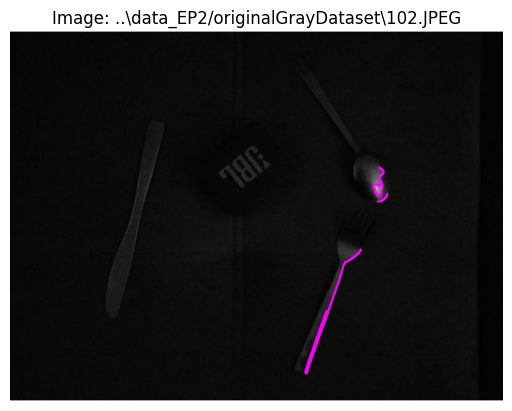

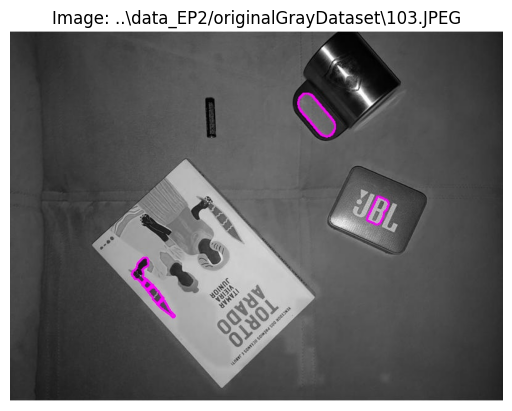

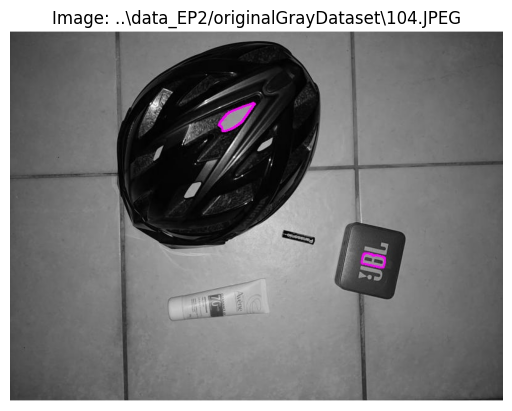

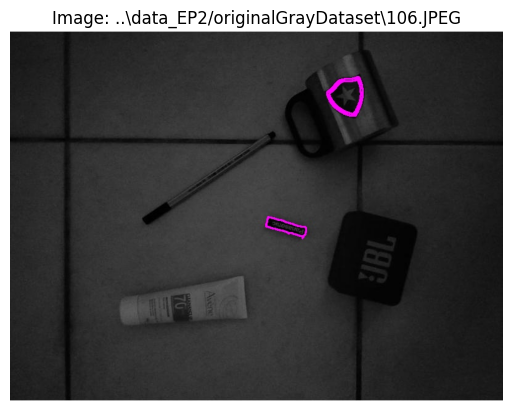

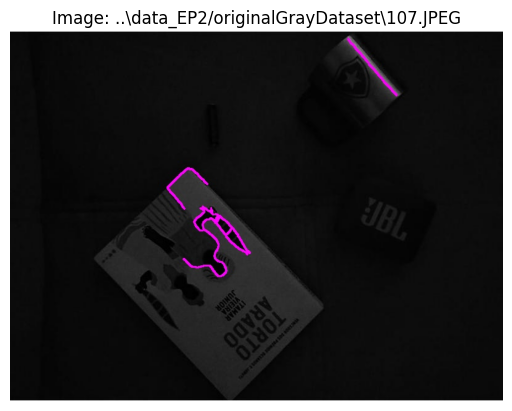

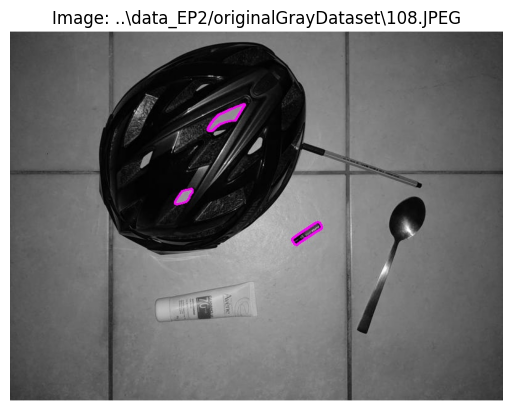

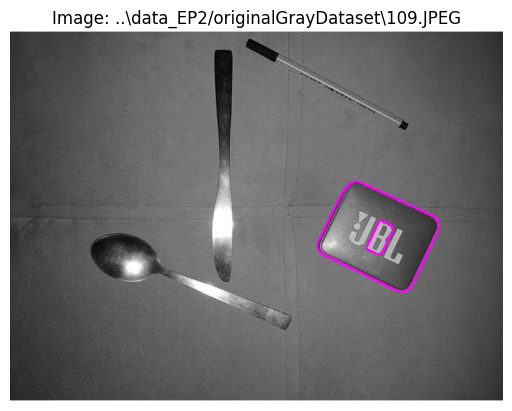

In [34]:

def load_image(image_path):
    
    img = cv2.imread(image_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img_rgb

def evaluate_images(df, start, end):
    evaluations = []
    for idx in range(start, end):
        df = pd.read_csv('image_evaluations.csv')
        row = df.iloc[idx]
        image_path = row['path_contorno']
        img = load_image(image_path)
        
        plt.imshow(img)
        plt.title(f"Image: {row['path_origin']}")
        plt.axis('off')
        plt.show()

        user_input = input("Is the image good? (y/n): ").strip().lower()
        if user_input in ['y', 'n']:
            evaluations.append(user_input == 'y')
            df.at[idx, 'is_good'] = user_input == 'y'
            df.to_csv('image_evaluations.csv', index=False)  # Save after each evaluation
            
        else:
            print("Invalid input. Please enter 'y' or 'n'.")

    return df

df_EP3['is_good'] = None

start = int(input("Enter the start index: "))
end = int(input("Enter the end index: "))

# Avaliar as imagens dentro do intervalo especificado
df = evaluate_images(df_EP3, start, end)


In [37]:
df_EP3 = pd.read_csv('image_evaluations.csv')
## Filtra apenas os avaliados como boas imagens
df_EP3_validated = df_EP3[df_EP3['is_good'] == True]

In [39]:
df_EP3_validated.shape

(243, 4)

### Salva as imagens selecionadas em um novo dataset

In [85]:
## Salva as imagens contornadas selecionadas em um novo dataset
def save_selected_images_contour(row, output_dir, img_path):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    img = load_image(row.path_contorno)
                       
    for i in img_path.split('\\')[3:-2]:
        output_dir = os.path.join(output_dir, i)
    base_filename = row.path_contorno.split('\\')[-1]
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    print(os.path.join(output_dir, base_filename))
    cv2.imwrite(os.path.join(output_dir, base_filename), img)



In [87]:
for row in df_EP3_validated.itertuples():
    print(row.path_contorno)
    # Para cada linha do dataframe salva a imagem no selectedData
    save_selected_images_contour(row, rf'..\\data_EP3\\selectedData\\contour\\', row.path_contorno)
    
    print('-------------------')

..\data_EP3\segmentedDataset\augmentedDataset\exponencial\gaussian_canny\006.JPEG
augmentedDataset
exponencial
..\\data_EP3\\selectedData\\contour\\augmentedDataset\exponencial
..\\data_EP3\\selectedData\\contour\\augmentedDataset\exponencial\006.JPEG
-------------------
..\data_EP3\segmentedDataset\augmentedDataset\exponencial\gaussian_canny\007.JPEG
augmentedDataset
exponencial
..\\data_EP3\\selectedData\\contour\\augmentedDataset\exponencial
..\\data_EP3\\selectedData\\contour\\augmentedDataset\exponencial\007.JPEG
-------------------
..\data_EP3\segmentedDataset\augmentedDataset\exponencial\gaussian_canny\009.JPEG
augmentedDataset
exponencial
..\\data_EP3\\selectedData\\contour\\augmentedDataset\exponencial
..\\data_EP3\\selectedData\\contour\\augmentedDataset\exponencial\009.JPEG
-------------------
..\data_EP3\segmentedDataset\augmentedDataset\exponencial\gaussian_canny\014.JPEG
augmentedDataset
exponencial
..\\data_EP3\\selectedData\\contour\\augmentedDataset\exponencial
..\\dat

In [113]:
## Salva a imagem original em um data set
def save_selected_images_origin(row, output_dir, img_path):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    img = load_image(img_path)
    
    img_path_final = img_path.split('/')[1]           
    for i in img_path_final.split('\\')[:-1]:
        i.lstrip('data_EP2')
        i.lstrip('data_EP2/')
        print(i)
        output_dir = os.path.join(output_dir, i)

    base_filename = img_path.split('\\')[-1]
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    print(os.path.join(output_dir, base_filename))
    cv2.imwrite(os.path.join(output_dir, base_filename), img)


In [115]:
for row in df_EP3_validated.itertuples():
    print(row.path_origin)
    # Para cada imagem selecionada salva a imagem original no selectedData
    save_selected_images_origin(row, rf'..\\data_EP3\\selectedData\\origin\\', row.path_origin)

    print('-------------------')

..\data_EP2/augmentedDataset\exponencial\006.JPEG
augmentedDataset
exponencial
..\\data_EP3\\selectedData\\origin\\augmentedDataset\exponencial\006.JPEG
-------------------
..\data_EP2/augmentedDataset\exponencial\007.JPEG
augmentedDataset
exponencial
..\\data_EP3\\selectedData\\origin\\augmentedDataset\exponencial\007.JPEG
-------------------
..\data_EP2/augmentedDataset\exponencial\009.JPEG
augmentedDataset
exponencial
..\\data_EP3\\selectedData\\origin\\augmentedDataset\exponencial\009.JPEG
-------------------
..\data_EP2/augmentedDataset\exponencial\014.JPEG
augmentedDataset
exponencial
..\\data_EP3\\selectedData\\origin\\augmentedDataset\exponencial\014.JPEG
-------------------
..\data_EP2/augmentedDataset\exponencial\015.JPEG
augmentedDataset
exponencial
..\\data_EP3\\selectedData\\origin\\augmentedDataset\exponencial\015.JPEG
-------------------
..\data_EP2/augmentedDataset\exponencial\016.JPEG
augmentedDataset
exponencial
..\\data_EP3\\selectedData\\origin\\augmentedDataset\exp